In [11]:
import pandas as pd

In [12]:
df=pd.read_csv("Cleaned_Final.csv")
df

,iso3,year,country,iso2,iso.numeric,g.whoregion,new.sp,new.sn,new.su,new.ep,...,pop,newinc,c.new.tsr,c.ret.tsr,ch,conf,ep,newrel.m,newrel.f,sex.ratio
0,ABW,1980,Aruba,AW,533,AMR,897.553237,440.145846,38.458236,251.895034,...,62267.0,40.874724,78.835358,70.235028,0.0,0.714756,0.073577,12.969388,7.989583,1.741111
1,ABW,1981,Aruba,AW,533,AMR,897.553237,440.145846,38.458236,251.895034,...,62614.0,40.874724,78.835358,70.235028,0.0,0.714756,0.073577,12.969388,7.989583,1.741111
2,ABW,1982,Aruba,AW,533,AMR,897.553237,440.145846,38.458236,251.895034,...,63116.0,40.874724,78.835358,70.235028,0.0,0.714756,0.073577,12.969388,7.989583,1.741111
3,ABW,1983,Aruba,AW,533,AMR,897.553237,440.145846,38.458236,251.895034,...,63683.0,40.874724,78.835358,70.235028,0.0,0.714756,0.073577,12.969388,7.989583,1.741111
4,ABW,1984,Aruba,AW,533,AMR,897.553237,440.145846,38.458236,251.895034,...,64174.0,40.874724,78.835358,70.235028,0.0,0.714756,0.073577,12.969388,7.989583,1.741111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4599,ZWE,1989,Zimbabwe,ZW,716,AFR,897.553237,440.145846,38.458236,251.895034,...,9846346.0,69.284585,78.835358,70.235028,0.0,0.714756,0.000000,12.969388,7.989583,1.741111
4600,ZWE,1990,Zimbabwe,ZW,716,AFR,897.553237,440.145846,38.458236,251.895034,...,10113893.0,90.291641,78.835358,70.235028,0.0,0.714756,0.000000,12.969388,7.989583,1.741111
4601,ZWE,1991,Zimbabwe,ZW,716,AFR,897.553237,440.145846,38.458236,251.895034,...,10377815.0,112.836854,78.835358,70.235028,0.0,0.714756,0.000000,12.969388,7.989583,1.741111
4602,ZWE,1992,Zimbabwe,ZW,716,AFR,897.553237,440.145846,38.458236,251.895034,...,10641501.0,152.581859,78.835358,70.235028,0.0,0.714756,0.000000,12.969388,7.989583,1.741111


In [13]:
pip install networkx plotly pandas


Note: you may need to restart the kernel to use updated packages.


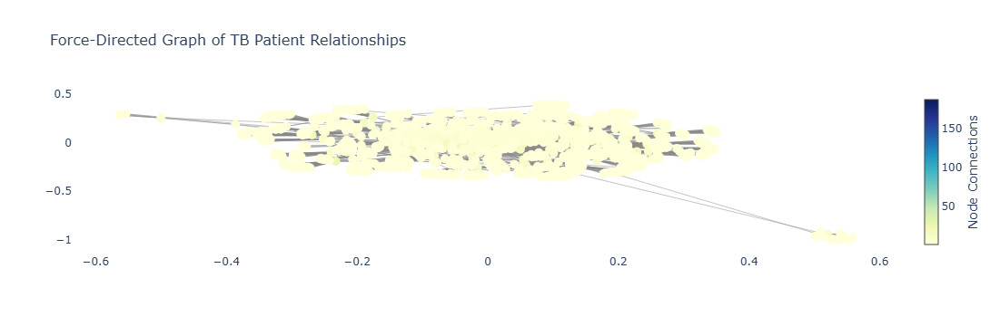

In [15]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go


# Choose relevant columns
countries = df['country'].unique()  # List of unique countries
region = df['g.whoregion'].unique()  # List of regions

# Example relationship data (can be based on disease metrics or treatment data)
relationships = []
for idx, row in df.iterrows():
    # Example relationship between country and disease metric, using 'new.sp' (new cases)
    relationships.append((row['country'], row['new.sp']))  # Replace 'new.sp' with other metrics if needed

# Create a graph
G = nx.Graph()

# Add nodes to the graph (countries as nodes)
for country in countries:
    G.add_node(country)

# Add edges to the graph (relationships between countries, based on 'new.sp' data)
for rel in relationships:
    country1, country2 = rel
    G.add_edge(country1, country2, weight=1)  # Adjust 'weight' or other attributes as needed

# Visualize the graph using Plotly for interactivity
pos = nx.spring_layout(G)  # Generate positions for nodes

# Extract node positions for Plotly
x_nodes = [pos[node][0] for node in G.nodes()]
y_nodes = [pos[node][1] for node in G.nodes()]

# Create edge traces
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_y.append(y0)
    edge_y.append(y1)

# Create node trace (for visualization)
node_trace = go.Scatter(
    x=x_nodes,
    y=y_nodes,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

# Add hover information to nodes
node_text = []
for country in G.nodes():
    node_text.append(f'Country: {country}')
node_trace.marker.color = [len(list(G.neighbors(country))) for country in G.nodes()]
node_trace.text = node_text

# Create edge trace (for relationships)
edge_trace = go.Scatter(
    x=edge_x,
    y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

# Layout for the graph
layout = go.Layout(
    title='Force-Directed Graph of TB Patient Relationships',
    titlefont_size=16,
    showlegend=False,
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False),
    plot_bgcolor='rgba(0,0,0,0)',
)

# Create the plot
fig = go.Figure(data=[edge_trace, node_trace], layout=layout)

# Show the plot
fig.show()


In [24]:
unique_countries = df['country'].unique()
print(unique_countries)

['Aruba' 'Afghanistan' 'Angola' 'Anguilla' 'Albania' 'Andorra'
 'Netherlands Antilles' 'United Arab Emirates' 'Argentina' 'Armenia'
 'American Samoa' 'Antigua and Barbuda' 'Australia' 'Austria' 'Azerbaijan'
 'Burundi' 'Belgium' 'Benin' 'Burkina Faso' 'Bulgaria' 'Bahrain' 'Bahamas'
 'Bosnia and Herzegovina' 'Belarus' 'Belize' 'Bermuda'
 'Bolivia (Plurinational State of)' 'Barbados' 'Brunei Darussalam'
 'Bhutan' 'Central African Republic' 'Canada' 'Switzerland' 'Chile'
 "Côte d'Ivoire" 'Cameroon' 'Democratic Republic of the Congo' 'Congo'
 'Cook Islands' 'Colombia' 'Comoros' 'Cabo Verde' 'Costa Rica' 'Cuba'
 'Curaçao' 'Cayman Islands' 'Cyprus' 'Czechia' 'Djibouti' 'Dominica'
 'Denmark' 'Dominican Republic' 'Algeria' 'Ecuador' 'Eritrea' 'Estonia'
 'Finland' 'Fiji' 'Micronesia (Federated States of)' 'Gabon'
 'United Kingdom of Great Britain and Northern Ireland' 'Georgia' 'Ghana'
 'Guinea' 'Gambia' 'Guinea-Bissau' 'Equatorial Guinea' 'Greece' 'Grenada'
 'Greenland' 'Guatemala' 'Guam' 'Guya

In [46]:
import pandas as pd
import time
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import plotly.express as px
import matplotlib.pyplot as plt
import geopandas as gpd

# Load your CSV file
df = pd.read_csv("Cleaned_Final.csv")

# Ensure the 'new.sp' column is numeric and handle errors if any
df['new.sp'] = pd.to_numeric(df['new.sp'], errors='coerce')
# Predefined coordinates for all countries
country_coords = {
    'Aruba': (12.5211, -69.9683),
    'Afghanistan': (33.9391, 67.7100),
    'Angola': (-11.2027, 17.8739),
    'Anguilla': (18.2206, -63.0686),
    'Albania': (41.1533, 20.1683),
    'Andorra': (42.5078, 1.5211),
    'Netherlands Antilles': (12.2265, -69.0651),
    'United Arab Emirates': (23.4241, 53.8478),
    'Argentina': (-38.4161, -63.6167),
    'Armenia': (40.0691, 45.0382),
    'American Samoa': (-14.2700, -170.1322),
    'Antigua and Barbuda': (17.0608, -61.7964),
    'Australia': (-25.2744, 133.7751),
    'Austria': (47.5162, 14.5501),
    'Azerbaijan': (40.1431, 47.5769),
    'Burundi': (-3.3731, 29.9189),
    'Belgium': (50.8503, 4.3517),
    'Benin': (9.3075, 2.3158),
    'Burkina Faso': (12.2383, -1.5616),
    'Bulgaria': (42.7339, 25.4858),
    'Bahrain': (25.9304, 50.6378),
    'Bahamas': (25.0343, -77.3963),
    'Bosnia and Herzegovina': (43.8486, 18.3564),
    'Belarus': (53.7098, 27.9534),
    'Belize': (17.1899, -88.4976),
    'Bermuda': (32.3213, -64.7574),
    'Bolivia (Plurinational State of)': (-16.2902, -63.5887),
    'Barbados': (13.1939, -59.5432),
    'Brunei Darussalam': (4.5353, 114.7277),
    'Bhutan': (27.5147, 90.4336),
    'Central African Republic': (6.6111, 20.9394),
    'Canada': (56.1304, -106.3468),
    'Switzerland': (46.8182, 8.2275),
    'Chile': (-35.6751, -71.5430),
    "Côte d'Ivoire": (7.539989, -5.547080),
    'Cameroon': (3.8480, 11.5021),
    'Democratic Republic of the Congo': (-4.0383, 21.7587),
    'Congo': (-4.2586, 15.2429),
    'Cook Islands': (-21.2367, -159.7777),
    'Colombia': (4.5709, -74.2973),
    'Comoros': (-11.8750, 43.8722),
    'Cabo Verde': (16.0020, -24.0132),
    'Costa Rica': (9.7489, -83.7534),
    'Cuba': (21.5218, -77.7812),
    'Curaçao': (12.1696, -68.9900),
    'Cayman Islands': (19.3131, -81.2546),
    'Cyprus': (35.1264, 33.4299),
    'Czechia': (49.8175, 15.4730),
    'Djibouti': (11.8251, 42.5903),
    'Dominica': (15.4149, -61.3703),
    'Denmark': (56.2639, 9.5018),
    'Dominican Republic': (18.7357, -70.1627),
    'Algeria': (28.0339, 1.6596),
    'Ecuador': (-1.8312, -78.1834),
    'Eritrea': (15.1794, 39.7823),
    'Estonia': (58.5953, 25.0136),
    'Finland': (61.9241, 25.7482),
    'Fiji': (-16.5782, 179.4144),
    'Micronesia (Federated States of)': (6.9101, 158.2491),
    'Gabon': (-0.8037, 11.6094),
    'United Kingdom of Great Britain and Northern Ireland': (55.3781, -3.4360),
    'Georgia': (42.3154, 43.3569),
    'Ghana': (7.9465, -1.0232),
    'Guinea': (9.9456, -9.6966),
    'Gambia': (13.4432, -15.3101),
    'Guinea-Bissau': (11.8037, -15.1804),
    'Equatorial Guinea': (1.6508, 10.2679),
    'Greece': (39.0742, 21.8243),
    'Grenada': (12.2628, -61.6042),
    'Greenland': (71.7069, -42.6043),
    'Guatemala': (15.7835, -90.2308),
    'Guam': (13.4443, 144.7937),
    'Guyana': (4.8604, -58.9302),
    'China, Hong Kong SAR': (22.3193, 114.1694),
    'Honduras': (13.9440, -83.3938),
    'Croatia': (45.1, 15.2),
    'Haiti': (18.9712, -72.2852),
    'Hungary': (47.1625, 19.5033),
    'Ireland': (53.1424, -7.6921),
    'Iraq': (33.2232, 43.6793),
    'Iceland': (64.9631, -19.0208),
    'Israel': (31.4680, 35.2048),
    'Italy': (41.8719, 12.5674),
    'Jamaica': (18.1096, -77.2975),
    'Jordan': (30.5852, 36.2384),
    'Kazakhstan': (48.0196, 66.9237),
    'Kenya': (-1.2921, 36.8219),
    'Kyrgyzstan': (41.2044, 74.7661),
    'Cambodia': (12.5657, 104.9910),
    'Kiribati': (-3.3704, -168.7340),
    'Saint Kitts and Nevis': (17.3572, -62.7838),
    'Kuwait': (29.3759, 47.9774),
    "Lao People's Democratic Republic": (19.8563, 102.4955),
    'Lebanon': (33.8547, 35.8623),
    'Liberia': (6.4281, -9.4295),
    'Libya': (26.3351, 17.2283),
    'Saint Lucia': (13.9094, -60.9789),
    'Sri Lanka': (7.8755, 80.7718),
    'Lesotho': (-29.6098, 28.2336),
    'Lithuania': (55.1694, 23.8813),
    'Luxembourg': (49.6117, 6.13),
    'Latvia': (56.8796, 24.6032),
    'China, Macao SAR': (22.1987, 113.5439),
    'Morocco': (31.7917, -7.0926),
    'Monaco': (43.7333, 7.4167),
    'Republic of Moldova': (47.4116, 28.3699),
    'Madagascar': (-18.7669, 46.8691),
    'Maldives': (3.2028, 73.2207),
    'Malawi': (-13.2543, 34.3015),
    'Mexico': (23.6345, -102.5528),
    'Malaysia': (4.2105, 101.9758),
    'Mozambique': (-18.6657, 35.5296),
    'Namibia': (-22.9576, 18.4904),
    'New Caledonia': (-20.9043, 165.6180),
    'Niger': (17.6078, 8.0817),
    'Nigeria': (9.0820, 8.6753),
    'Nicaragua': (12.8654, -85.2072),
    'Netherlands': (52.1326, 5.2913),
    'Norway': (60.4720, 8.4689),
    'Nepal': (28.3949, 84.1240),
    'Nauru': (-0.5228, 166.9315),
    'New Zealand': (-40.9006, 174.8860),
    'Oman': (21.5126, 55.9233),
    'Panama': (8.5375, -80.7821),
    'Peru': (-9.1900, -75.0152),
    'French Polynesia': (-17.6797, -149.4068),
    'Papua New Guinea': (-6.3149, 143.9555),
    'Philippines': (12.8797, 121.7740),
    'Pakistan': (30.3753, 69.3451),
    'Poland': (51.9194, 19.1451),
    'Saint Pierre and Miquelon': (46.8852, -56.3159),
    'Pitcairn': (-24.7033, -127.4392),
    'Puerto Rico': (18.2208, -66.5902),
    'Palestine, State of': (31.9522, 35.2332),
    'Portugal': (39.3999, -8.2245),
    'Palau': (7.5149, 134.5825),
    'Paraguay': (-23.4425, -58.4438),
    'Qatar': (25.3548, 51.1839),
    'Romania': (45.9432, 24.9668),
    'Serbia': (44.0165, 21.0059),
    'Russian Federation': (55.7558, 37.6176),
    'Rwanda': (-1.9403, 29.8739),
    'Saudi Arabia': (23.8859, 45.0792),
    'Solomon Islands': (-29.6098, 28.2336),
    'Seychelles': (-4.6796, 55.4915),
    'Sudan': (12.8628, 30.2176),
    'Sweden': (60.1282, 18.6435),
    'Singapore': (1.3521, 103.8198),
    'Saint Helena, Ascension and Tristan da Cunha': (-24.1432, -10.0305),
    'Slovenia': (46.1511, 14.9955),
    'Svalbard and Jan Mayen': (77.9535, 15.3718),
    'Slovakia': (48.6690, 19.6990),
    'Sierra Leone': (8.4606, -11.7799),
    'San Marino': (43.9333, 12.45),
    'Senegal': (14.4974, -14.4524),
    'Somalia': (5.1521, 46.1996),
    'Suriname': (3.9193, -56.0278),
    'South Sudan': (6.8777, 31.3070),
    'Sao Tome and Principe': (0.1864, 6.6131),
    'El Salvador': (13.7942, -88.8965),
    'Sint Maarten (Dutch part)': (18.0425, -63.0537),
    'Swaziland': (-26.5225, 31.4659),
    'Seychelles': (-4.6796, 55.4915),
    'Chad': (15.4542, 18.7322),
    'French Southern Territories': (-49.2800, 69.3495),
    'Togo': (7.4465, 1.0021),
    'Thailand': (15.8700, 100.9925),
    'Tajikistan': (38.8610, 71.2761),
    'Tokelau': (-9.2005, -171.8575),
    'Timor-Leste': (-8.8742, 125.7275),
    'Tanzania (United Republic of)': (-6.369028, 34.888822),
    'Ukraine': (48.3794, 31.1656),
    'Uganda': (1.3733, 32.2903),
    'Uruguay': (-32.5228, -55.7658),
    'Uzbekistan': (41.3775, 64.5850),
    'Vanuatu': (-15.3767, 167.9892),
    'Venezuela (Bolivarian Republic of)': (6.4238, -66.5897),
    'Vietnam': (14.0583, 108.2772),
    'Vanuatu': (-15.3767, 167.9892),
    'Wallis and Futuna': (-13.3013, -176.1652),
    'Samoa': (-13.7590, -172.1046),
    'Yemen': (15.5522, 48.5164),
    'Mayotte': (-12.8275, 45.1662),
    'South Africa': (-30.5595, 22.9375),
    'Zambia': (-13.1339, 27.8493),
    'Zimbabwe': (-19.0154, 29.1549)
}

import pandas as pd
import folium
from branca.colormap import linear
def get_color(tot_newrel_value):
    # Define thresholds to categorize the 'tot.newrel' values
    if tot_newrel_value < 100:
        return 'green'  # Low cases
    elif 100 <= tot_newrel_value < 500:
        return 'orange'  # Medium cases
    else:
        return 'red'  # High cases

# Create a folium map centered around the world
m = folium.Map(location=[20, 0], zoom_start=2)

# Loop through each row in the dataframe
for _, row in df.iterrows():
    country_name = row['country']
    tot_newrel_value = row['tot.newrel']  # Using 'tot.newrel' for color coding
    
    # If 'tot.newrel' is NaN or not a valid number, skip the row
    if pd.isna(tot_newrel_value):
        continue
    
    # Get the coordinates from the predefined dictionary
    coordinates = country_coords.get(country_name)
    
    # If coordinates are found, add a marker with color coding
    if coordinates:
        lat, lon = coordinates
        
        # Get the color based on 'tot.newrel'
        marker_color = get_color(tot_newrel_value)
        
        # Create a folium marker with the color determined by 'tot.newrel'
        folium.Marker(
            location=[lat, lon],
            popup=f"{country_name}: {tot_newrel_value} new TB cases",
            icon=folium.Icon(color=marker_color)
        ).add_to(m)

# Display the map directly in Jupyter or IPython environment
m
  
